In [23]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [22]:
!pip install wordcloud

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.1/511.1 kB 3.0 MB/s eta 0:00:00


In [2]:
data1 = pd.read_csv('description.txt', delimiter='\t')  # if tab-separated
data2 = pd.read_csv('train_data.txt', delimiter='\t')
data3 = pd.read_csv('test_data.txt', delimiter='\t')
data4 = pd.read_csv('test_data_solution.txt', delimiter='\t')




In [3]:
print(data1.head())
print(data2.head())
print(data3.head())
print(data4.head())

                              Train data:
0  ID ::: TITLE ::: GENRE ::: DESCRIPTION
1  ID ::: TITLE ::: GENRE ::: DESCRIPTION
2  ID ::: TITLE ::: GENRE ::: DESCRIPTION
3  ID ::: TITLE ::: GENRE ::: DESCRIPTION
4                              Test data:
  1 ::: Oscar et la dame rose (2009) ::: drama ::: Listening in to a conversation between his doctor and parents, 10-year-old Oscar learns what nobody has the courage to tell him. He only has a few weeks to live. Furious, he refuses to speak to anyone except straight-talking Rose, the lady in pink he meets on the hospital stairs. As Christmas approaches, Rose uses her fantastical experiences as a professional wrestler, her imagination, wit and charm to allow Oscar to live life and love to the full, in the company of his friends Pop Corn, Einstein, Bacon and childhood sweetheart Peggy Blue.
0  2 ::: Cupid (1997) ::: thriller ::: A brother ...                                                                                                   

In [4]:
data1_cleaned = data1['Train data:'].str.split(' ::: ', expand=True)
# Rename the columns
data1_cleaned.columns = ['ID', 'TITLE', 'GENRE', 'DESCRIPTION']
# Drop the rows with missing genre (test data has no genre)
data1_cleaned = data1_cleaned.dropna(subset=['GENRE'])
# Preview cleaned data
print(data1_cleaned.head())

   ID  TITLE        GENRE  DESCRIPTION
0  ID  TITLE        GENRE  DESCRIPTION
1  ID  TITLE        GENRE  DESCRIPTION
2  ID  TITLE        GENRE  DESCRIPTION
3  ID  TITLE        GENRE  DESCRIPTION
5  ID  TITLE  DESCRIPTION         None


In [5]:
data2_cleaned = data2.iloc[:, 0].str.split(' ::: ', expand=True)
data2_cleaned.columns = ['ID', 'TITLE', 'GENRE', 'DESCRIPTION']

In [6]:
data3_cleaned = data3.iloc[:, 0].str.split(' ::: ', expand=True)

# Assign column names as needed
data3_cleaned.columns = ['ID', 'TITLE', 'DESCRIPTION']  # Test data has no GENRE

# Display the cleaned DataFrame
print(data3_cleaned.head())

  ID                        TITLE  \
0  2     La guerra de papá (1977)   
1  3  Off the Beaten Track (2010)   
2  4       Meu Amigo Hindu (2015)   
3  5            Er nu zhai (1955)   
4  6           Riddle Room (2016)   

                                         DESCRIPTION  
0  Spain, March 1964: Quico is a very naughty chi...  
1  One year in the life of Albin and his family o...  
2  His father has died, he hasn't spoken with his...  
3  Before he was known internationally as a marti...  
4  Emily Burns is being held captive in a room wi...  


In [7]:
data4_cleaned = data4.iloc[:, 0].str.split(' ::: ', expand=True)

# Assign column names as needed
data4_cleaned.columns = ['ID', 'TITLE', 'GENRE', 'DESCRIPTION']  # Include the genre for this dataset

# Display the cleaned DataFrame
print(data4_cleaned.head())

  ID                        TITLE        GENRE  \
0  2     La guerra de papá (1977)       comedy   
1  3  Off the Beaten Track (2010)  documentary   
2  4       Meu Amigo Hindu (2015)        drama   
3  5            Er nu zhai (1955)        drama   
4  6           Riddle Room (2016)       horror   

                                         DESCRIPTION  
0  Spain, March 1964: Quico is a very naughty chi...  
1  One year in the life of Albin and his family o...  
2  His father has died, he hasn't spoken with his...  
3  Before he was known internationally as a marti...  
4  Emily Burns is being held captive in a room wi...  


In [8]:
data_train = pd.concat([data1_cleaned, data2_cleaned], ignore_index=True)
data_test = pd.merge(data3_cleaned, data4_cleaned, on=['ID', 'TITLE'], how='left')

In [9]:
print(data_train.head())
print(data_test.head())

   ID  TITLE        GENRE  DESCRIPTION
0  ID  TITLE        GENRE  DESCRIPTION
1  ID  TITLE        GENRE  DESCRIPTION
2  ID  TITLE        GENRE  DESCRIPTION
3  ID  TITLE        GENRE  DESCRIPTION
4  ID  TITLE  DESCRIPTION         None
  ID                        TITLE  \
0  2     La guerra de papá (1977)   
1  3  Off the Beaten Track (2010)   
2  4       Meu Amigo Hindu (2015)   
3  5            Er nu zhai (1955)   
4  6           Riddle Room (2016)   

                                       DESCRIPTION_x        GENRE  \
0  Spain, March 1964: Quico is a very naughty chi...       comedy   
1  One year in the life of Albin and his family o...  documentary   
2  His father has died, he hasn't spoken with his...        drama   
3  Before he was known internationally as a marti...        drama   
4  Emily Burns is being held captive in a room wi...       horror   

                                       DESCRIPTION_y  
0  Spain, March 1964: Quico is a very naughty chi...  
1  One year in the

In [10]:
print(data_train.columns)
print(data_test.columns)

Index(['ID', 'TITLE', 'GENRE', 'DESCRIPTION'], dtype='object')
Index(['ID', 'TITLE', 'DESCRIPTION_x', 'GENRE', 'DESCRIPTION_y'], dtype='object')


In [11]:
data_test.rename(columns={'Description': 'DESCRIPTION'}, inplace=True)


In [12]:
print(data_test[['DESCRIPTION_x', 'DESCRIPTION_y']].head())

                                       DESCRIPTION_x  \
0  Spain, March 1964: Quico is a very naughty chi...   
1  One year in the life of Albin and his family o...   
2  His father has died, he hasn't spoken with his...   
3  Before he was known internationally as a marti...   
4  Emily Burns is being held captive in a room wi...   

                                       DESCRIPTION_y  
0  Spain, March 1964: Quico is a very naughty chi...  
1  One year in the life of Albin and his family o...  
2  His father has died, he hasn't spoken with his...  
3  Before he was known internationally as a marti...  
4  Emily Burns is being held captive in a room wi...  


In [13]:
X_train = data_train['DESCRIPTION']
y_train = data_train['GENRE']

X_test = data_test['DESCRIPTION_x']  # Use the correct column
y_test = data_test['GENRE']



In [14]:
print(X_train.isnull().sum())
print(X_test.isnull().sum())

4
0


In [15]:
X_train.fillna('', inplace=True)
X_test.fillna('', inplace=True)

In [16]:
X_train.dropna(inplace=True)
X_test.dropna(inplace=True)

In [17]:
tfidf = TfidfVectorizer(max_features=5000, stop_words='english')

X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

In [18]:
nb_model = MultinomialNB()
nb_model.fit(X_train_tfidf, y_train)

# Predict and evaluate
y_pred_nb = nb_model.predict(X_test_tfidf)
print("Naive Bayes Accuracy:", accuracy_score(y_test, y_pred_nb))
print("Naive Bayes Classification Report:\n", classification_report(y_test, y_pred_nb))

Naive Bayes Accuracy: 0.5240318087049577


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Naive Bayes Classification Report:
               precision    recall  f1-score   support

      action       0.55      0.11      0.18      1314
       adult       0.49      0.06      0.11       590
   adventure       0.81      0.07      0.13       775
   animation       0.00      0.00      0.00       498
   biography       0.00      0.00      0.00       264
      comedy       0.51      0.42      0.46      7446
       crime       0.00      0.00      0.00       505
 documentary       0.57      0.87      0.69     13096
       drama       0.46      0.82      0.59     13612
      family       0.50      0.00      0.00       783
     fantasy       0.00      0.00      0.00       322
   game-show       0.98      0.32      0.48       193
     history       0.00      0.00      0.00       243
      horror       0.69      0.36      0.47      2204
       music       0.74      0.15      0.25       731
     musical       0.00      0.00      0.00       276
     mystery       0.00      0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [19]:
lr_model = LogisticRegression(max_iter=200)
lr_model.fit(X_train_tfidf, y_train)

# Predict and evaluate
y_pred_lr = lr_model.predict(X_test_tfidf)
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_lr))
print("Logistic Regression Classification Report:\n", classification_report(y_test, y_pred_lr))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Accuracy: 0.5833133452646728


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Logistic Regression Classification Report:
               precision    recall  f1-score   support

      action       0.48      0.29      0.36      1314
       adult       0.61      0.24      0.34       590
   adventure       0.58      0.17      0.26       775
   animation       0.52      0.06      0.11       498
   biography       0.00      0.00      0.00       264
      comedy       0.52      0.58      0.55      7446
       crime       0.36      0.04      0.07       505
 documentary       0.67      0.85      0.75     13096
       drama       0.54      0.77      0.64     13612
      family       0.51      0.09      0.16       783
     fantasy       0.54      0.05      0.09       322
   game-show       0.89      0.51      0.65       193
     history       0.00      0.00      0.00       243
      horror       0.64      0.57      0.60      2204
       music       0.68      0.46      0.55       731
     musical       0.28      0.02      0.03       276
     mystery       0.31      0.01    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [20]:
svm_model = SVC(kernel='linear')
svm_model.fit(X_train_tfidf, y_train)

# Predict and evaluate
y_pred_svm = svm_model.predict(X_test_tfidf)
print("SVM Accuracy:", accuracy_score(y_test, y_pred_svm))
print("SVM Classification Report:\n", classification_report(y_test, y_pred_svm))

SVM Accuracy: 0.5852691009059208


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


SVM Classification Report:
               precision    recall  f1-score   support

      action       0.42      0.35      0.38      1314
       adult       0.57      0.36      0.44       590
   adventure       0.50      0.21      0.30       775
   animation       0.42      0.13      0.19       498
   biography       0.00      0.00      0.00       264
      comedy       0.52      0.58      0.55      7446
       crime       0.28      0.06      0.09       505
 documentary       0.68      0.84      0.75     13096
       drama       0.55      0.75      0.63     13612
      family       0.45      0.10      0.17       783
     fantasy       0.44      0.11      0.17       322
   game-show       0.82      0.61      0.70       193
     history       0.00      0.00      0.00       243
      horror       0.64      0.59      0.62      2204
       music       0.66      0.49      0.56       731
     musical       0.35      0.05      0.08       276
     mystery       0.37      0.02      0.04       318

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Generating word cloud for genre: GENRE...


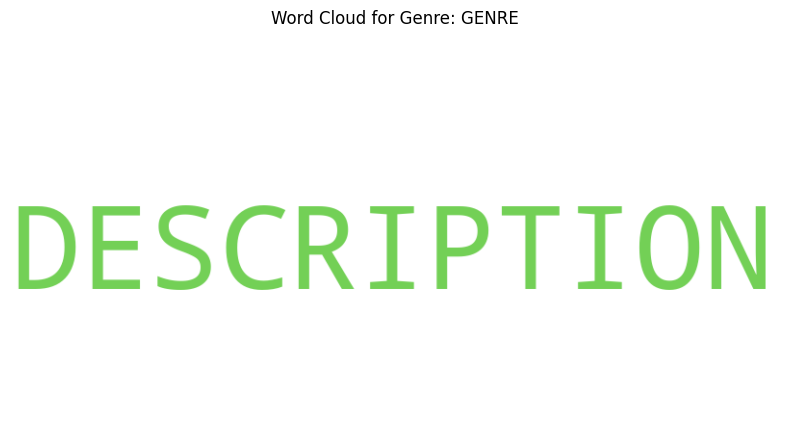

Generating word cloud for genre: DESCRIPTION...
No valid descriptions found for genre: DESCRIPTION
Generating word cloud for genre: thriller...


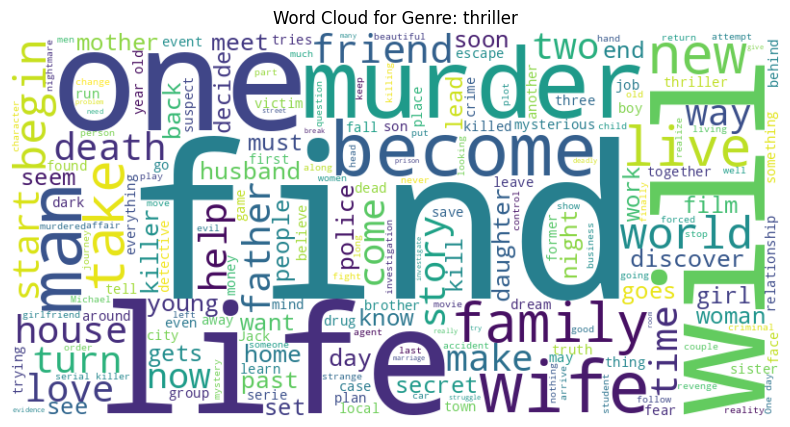

Generating word cloud for genre: adult...


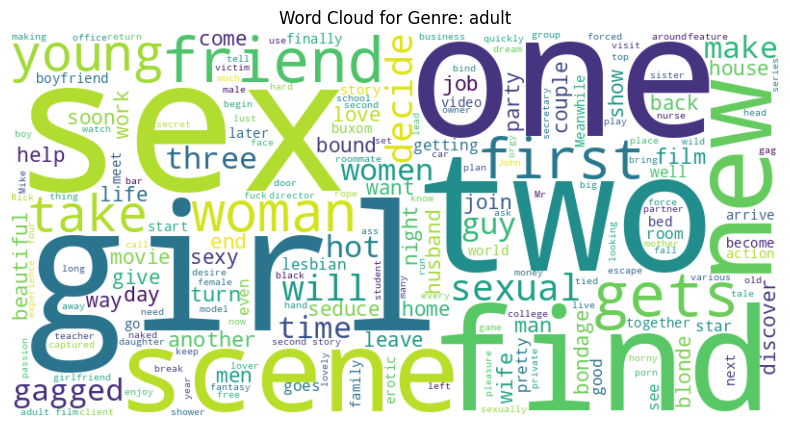

Generating word cloud for genre: drama...


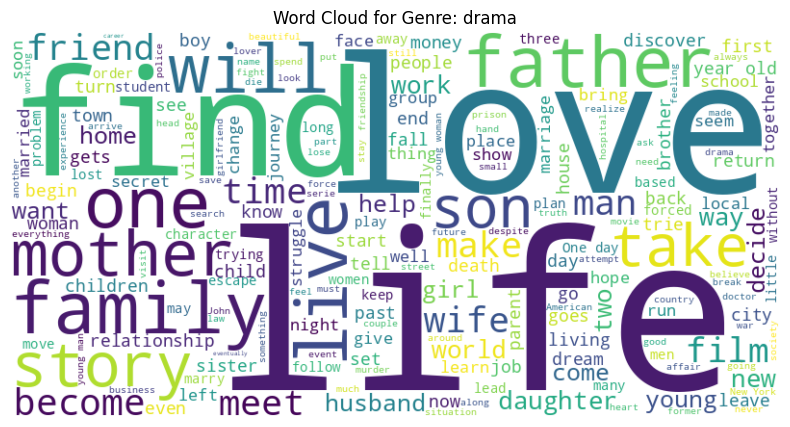

Generating word cloud for genre: documentary...


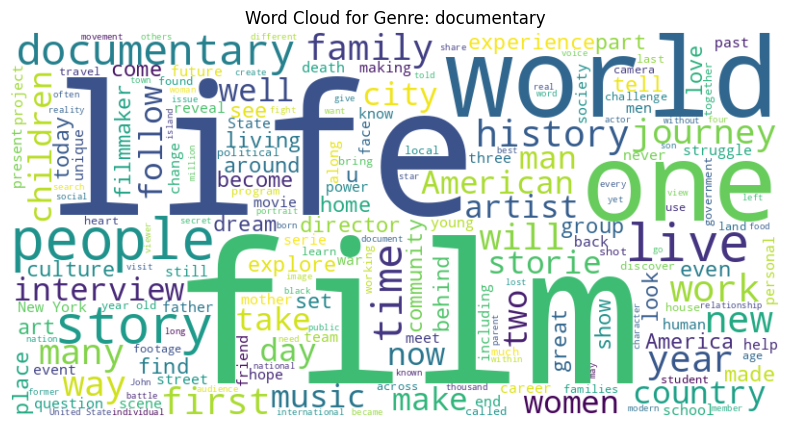

Generating word cloud for genre: comedy...


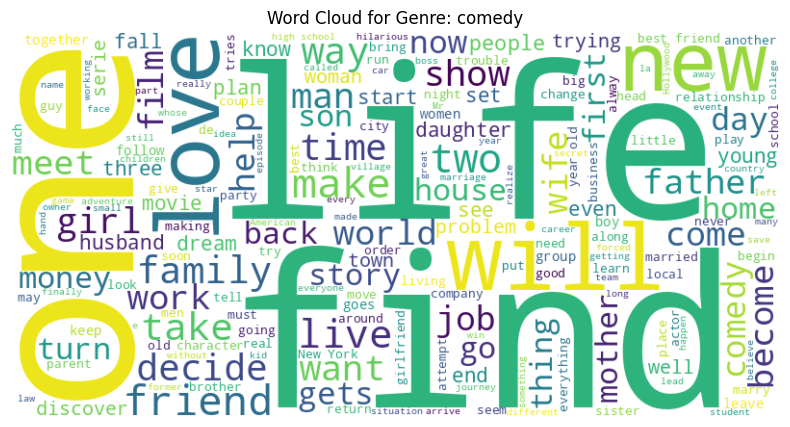

Generating word cloud for genre: crime...


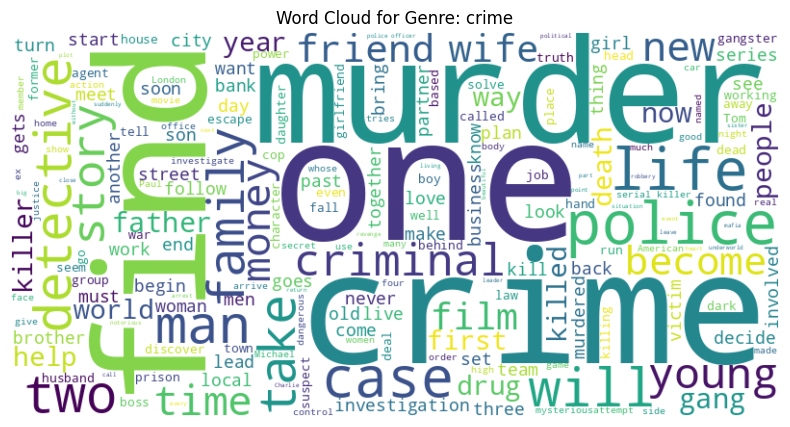

Generating word cloud for genre: reality-tv...


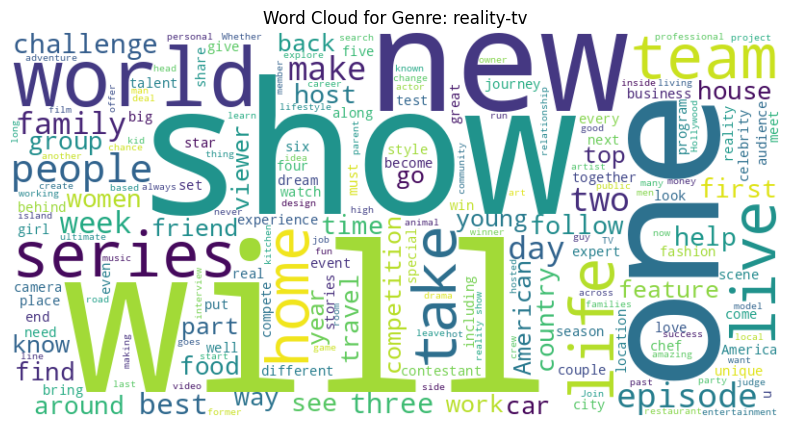

Generating word cloud for genre: horror...


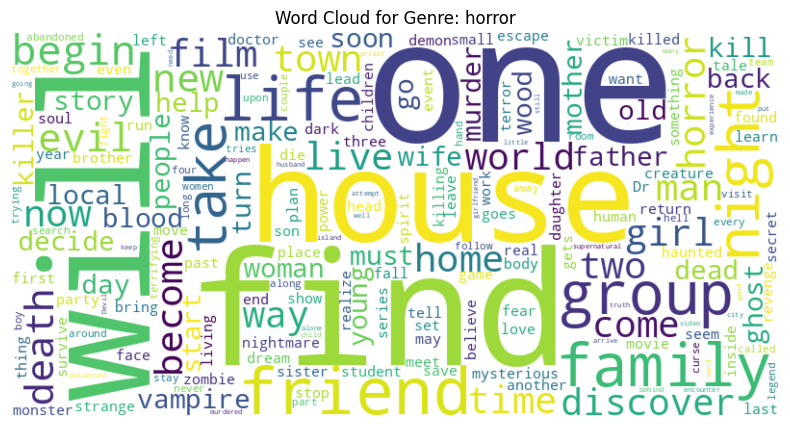

Generating word cloud for genre: sport...


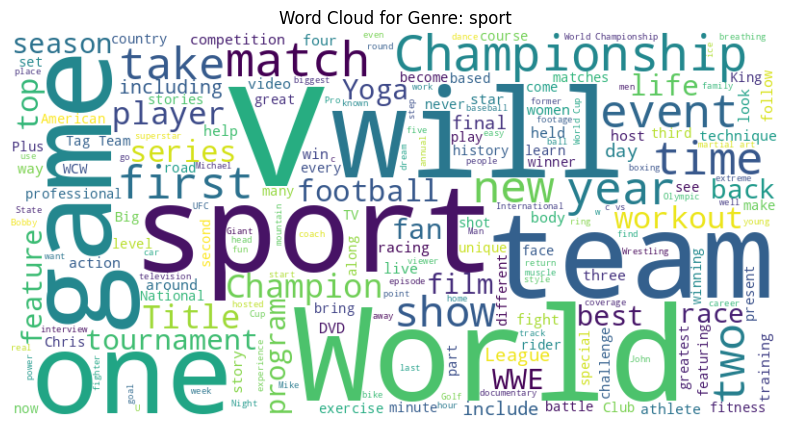

Generating word cloud for genre: animation...


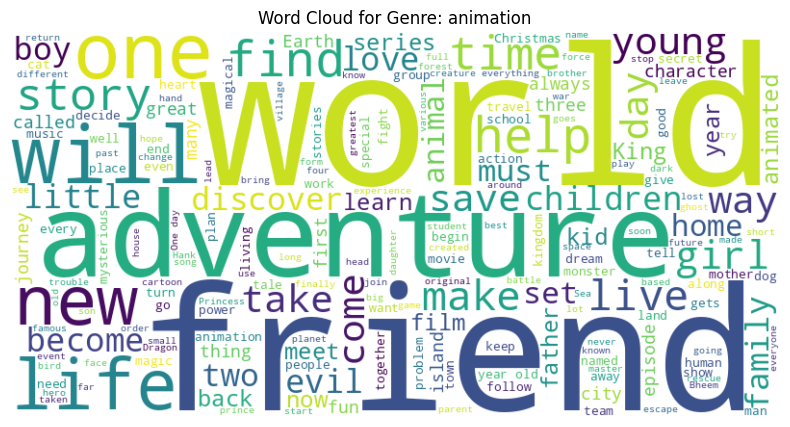

Generating word cloud for genre: action...


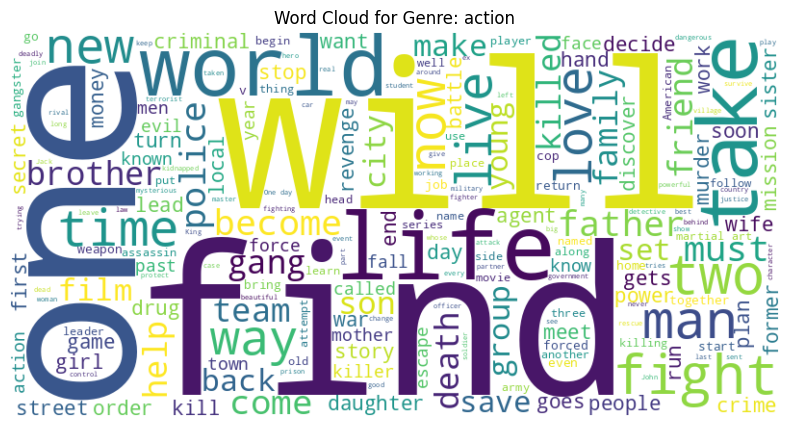

Generating word cloud for genre: fantasy...


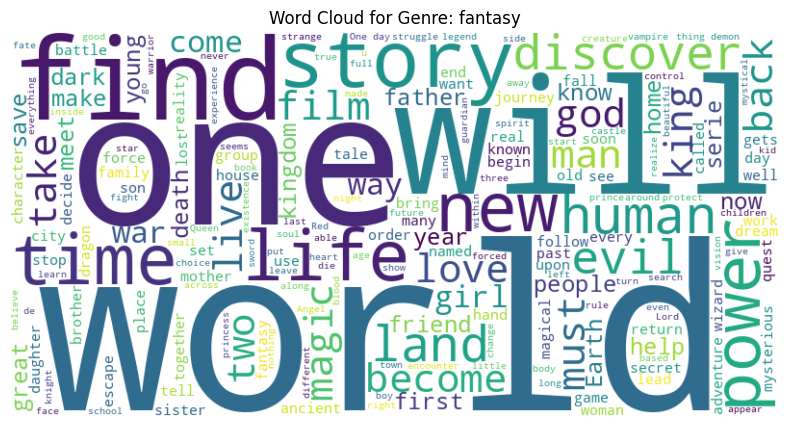

Generating word cloud for genre: short...


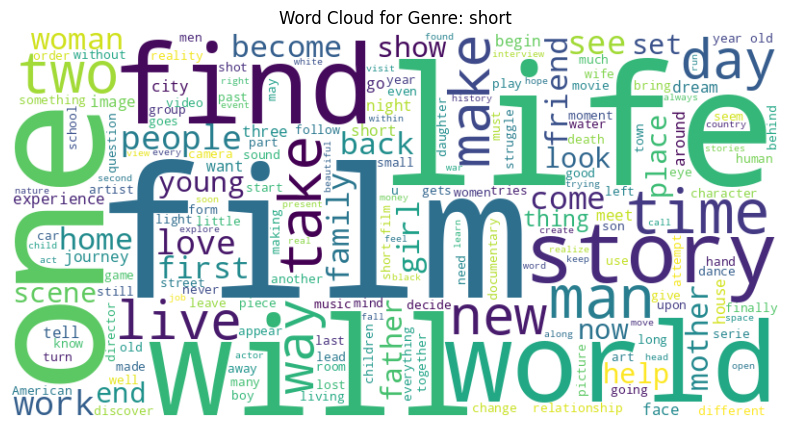

Generating word cloud for genre: sci-fi...


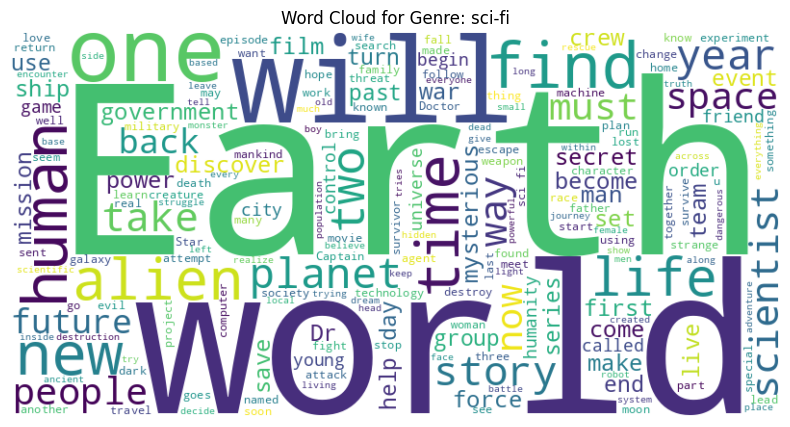

Generating word cloud for genre: music...


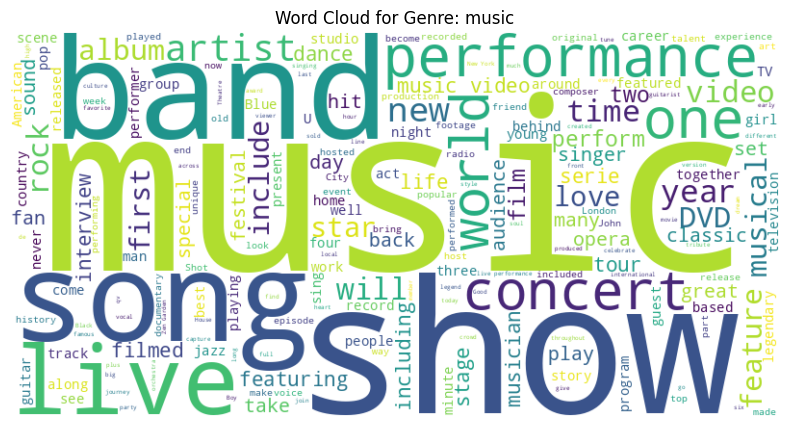

Generating word cloud for genre: adventure...


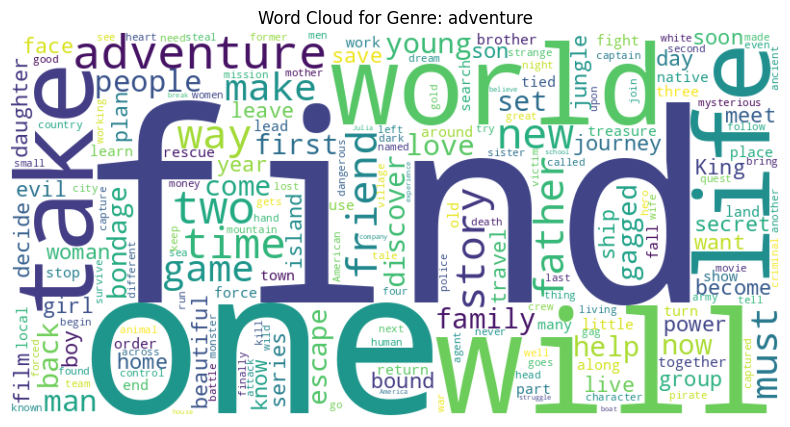

Generating word cloud for genre: talk-show...


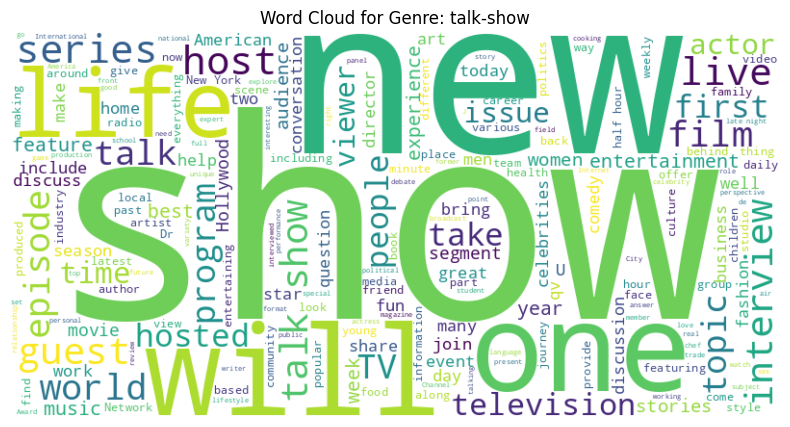

Generating word cloud for genre: western...


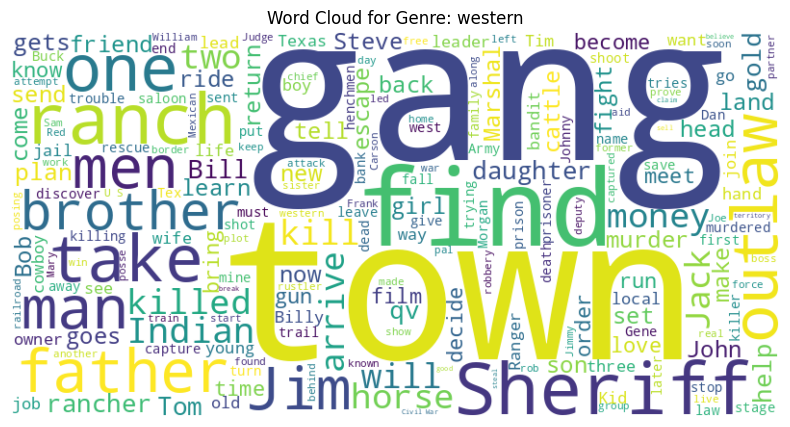

Generating word cloud for genre: family...


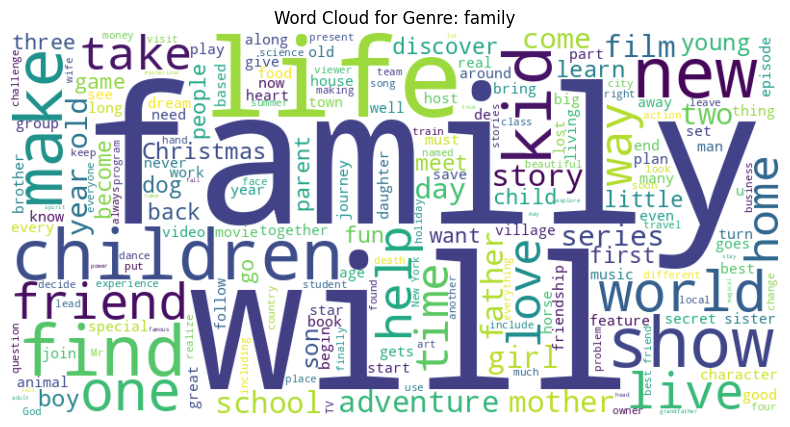

Generating word cloud for genre: mystery...


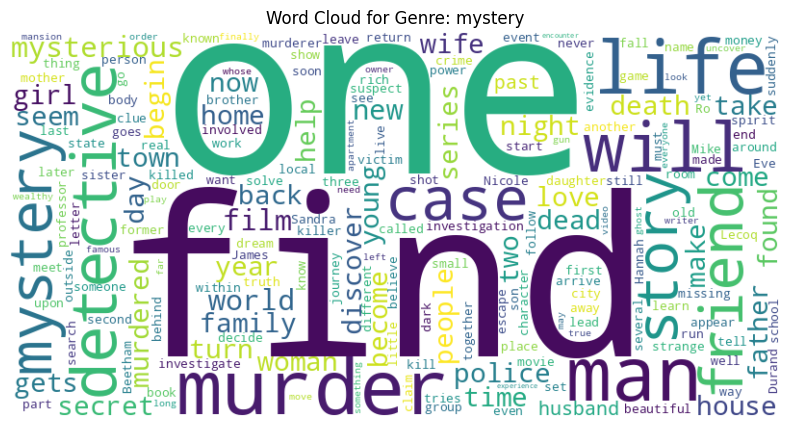

Generating word cloud for genre: history...


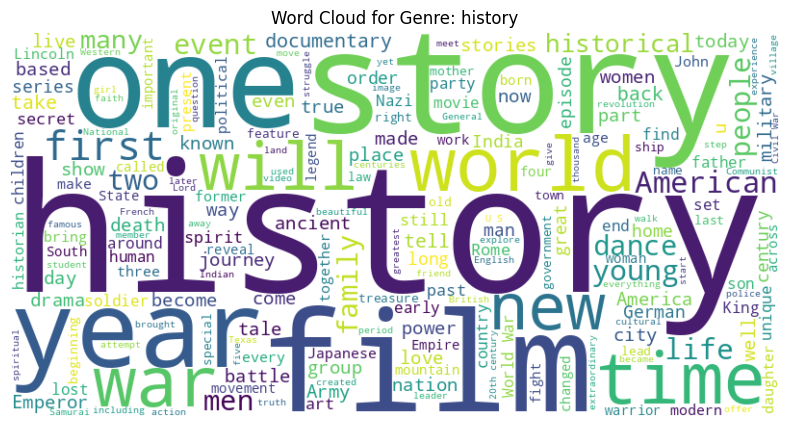

Generating word cloud for genre: news...


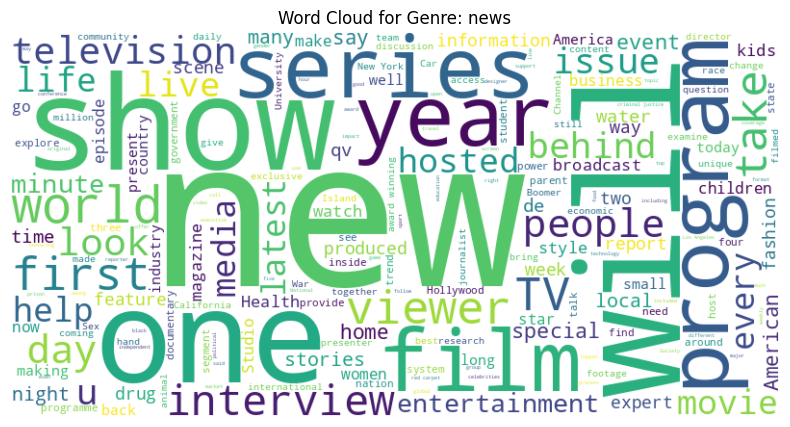

Generating word cloud for genre: biography...


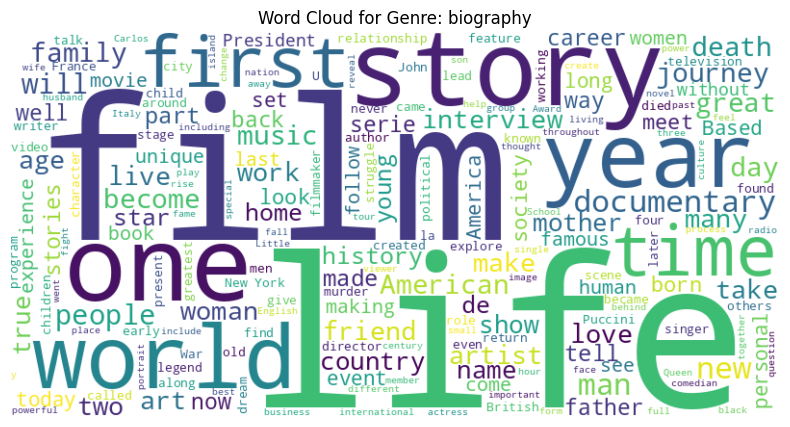

Generating word cloud for genre: romance...


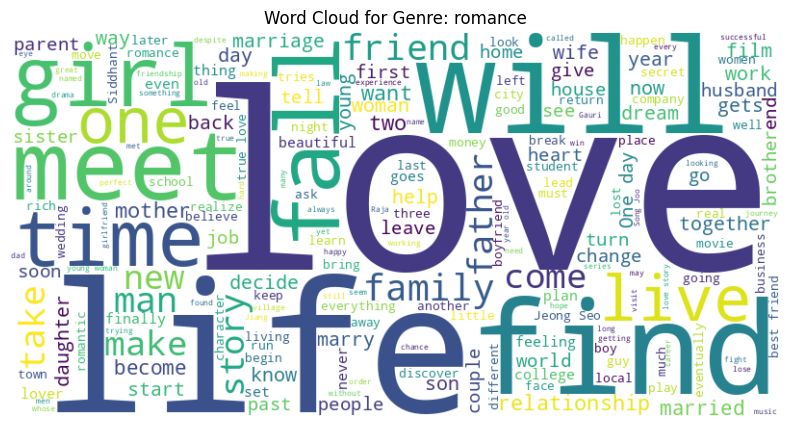

Generating word cloud for genre: game-show...


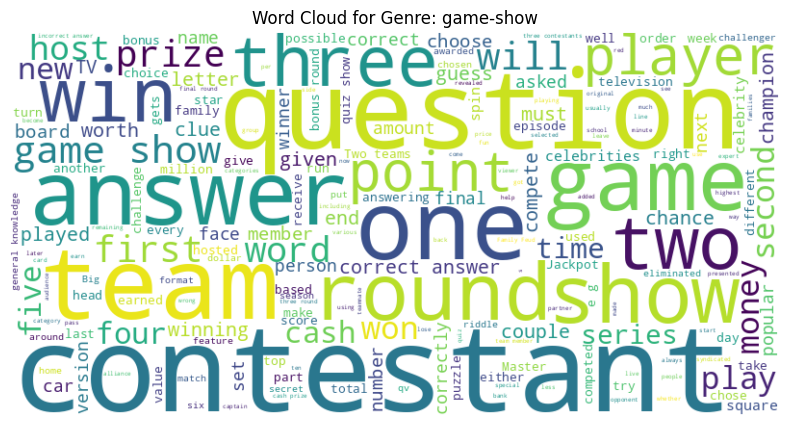

Generating word cloud for genre: musical...


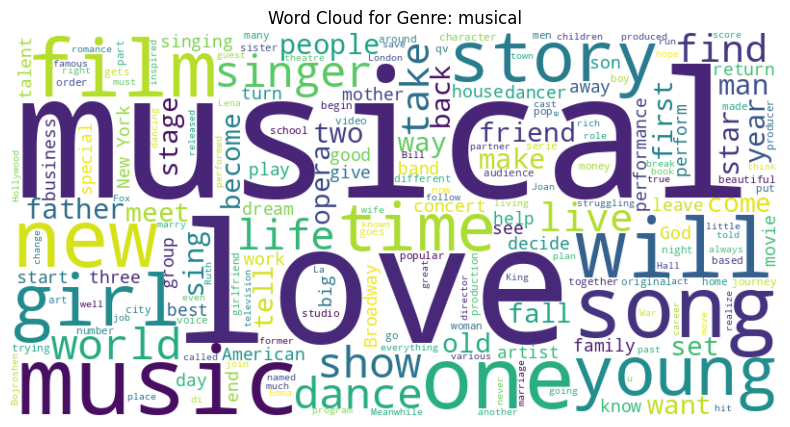

Generating word cloud for genre: war...


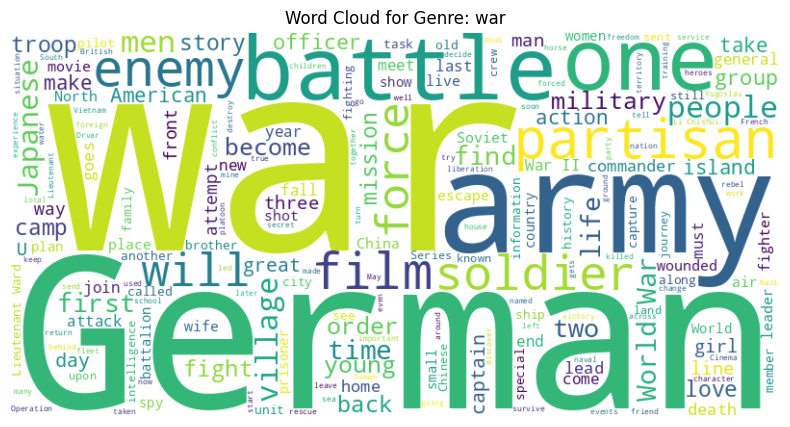

In [25]:
def generate_word_cloud(data, genre, background_color='white', max_words=200):
    # Filter the descriptions for the given genre and drop any NaN values
    descriptions = data[data['GENRE'] == genre]['DESCRIPTION'].dropna()

    # Join all descriptions into a single string
    text = ' '.join(descriptions)

    # Check if the generated text contains any non-whitespace characters
    if text.strip():
        # Generate word cloud
        wordcloud = WordCloud(
            width=800,
            height=400,
            background_color=background_color,
            max_words=max_words
        ).generate(text)

        # Plot the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')  # Hide the axis
        plt.title(f'Word Cloud for Genre: {genre}')
        plt.show()
    else:
        print(f'No valid descriptions found for genre: {genre}')

# Get unique genres
unique_genres = data_train['GENRE'].unique()

# Generate word clouds for each genre
for genre in unique_genres:
    print(f'Generating word cloud for genre: {genre}...')
    generate_word_cloud(data_train, genre)